In [ ]:
from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())

2024-02-28 14:46:30.250279: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-02-28 14:46:30.250493: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-02-28 14:46:30.251073: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-02-28 14:46:30.316997: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 14611693013121248670
xla_global_id: -1
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 6037389312
locality {
  bus_id: 1
  links {
  }
}
incarnation: 10362933061758008541
physical_device_desc: "device: 0, name: NVIDIA GeForce RTX 2070 SUPER, pci bus id: 0000:01:00.0, compute capability: 7.5"
xla_global_id: 416903419
]


2024-02-28 14:46:34.966647: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:880] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-02-28 14:46:35.017823: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:880] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-02-28 14:46:35.017860: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:880] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-02-28 14:46:35.484089: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:880] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-02-28 14:46:35.484193: I tensorflow/compile

In [ ]:
pip install imutils

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [ ]:
pip install shap

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [ ]:
#Importing libraries
import tensorflow as tf
from tensorflow.keras.applications.resnet import preprocess_input
import shap
import json

Model - DeneNet121

In [ ]:
model = tf.keras.applications.resnet50.ResNet50(
    include_top=True,
    weights='imagenet',
    input_tensor=None,
    input_shape=None,
    pooling=None,
    classes=1000,
)
model.summary()

2024-02-28 14:46:43.106809: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:880] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-02-28 14:46:43.106883: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:880] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-02-28 14:46:43.106902: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:880] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-02-28 14:46:43.107190: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:880] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-02-28 14:46:43.107214: I tensorflow/compile

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1_conv[0][0]']          
 on)                                                                                       

In [ ]:
url = "https://s3.amazonaws.com/deep-learning-models/image-models/imagenet_class_index.json"
with open(shap.datasets.cache(url)) as file:
    class_names = [v[1] for v in json.load(file).values()]

In [ ]:
pip install opencv-python

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


Dataset

In [ ]:
from imutils import paths
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import numpy as np

image_path='imagenet-sample-images-master'
images=[]
imagepaths = list(paths.list_images(image_path))
for imagepath in imagepaths:
  image = load_img(imagepath, target_size=(224,224))
  images.append(np.array(image))
images=np.asarray(images)

In [ ]:
imagepaths

['imagenet-sample-images-master/n13054560_bolete.JPEG',
 'imagenet-sample-images-master/n07695742_pretzel.JPEG',
 'imagenet-sample-images-master/n13037406_gyromitra.JPEG',
 'imagenet-sample-images-master/n07717556_butternut_squash.JPEG',
 'imagenet-sample-images-master/n07714571_head_cabbage.JPEG',
 'imagenet-sample-images-master/n07714990_broccoli.JPEG',
 'imagenet-sample-images-master/n07697313_cheeseburger.JPEG',
 'imagenet-sample-images-master/n07753113_fig.JPEG',
 'imagenet-sample-images-master/n07697537_hotdog.JPEG',
 'imagenet-sample-images-master/n07584110_consomme.JPEG',
 'imagenet-sample-images-master/n07745940_strawberry.JPEG',
 'imagenet-sample-images-master/n07613480_trifle.JPEG',
 'imagenet-sample-images-master/n07730033_cardoon.JPEG',
 'imagenet-sample-images-master/n04550184_wardrobe.JPEG',
 'imagenet-sample-images-master/n12985857_coral_fungus.JPEG',
 'imagenet-sample-images-master/n04517823_vacuum.JPEG',
 'imagenet-sample-images-master/n04532670_viaduct.JPEG',
 'image

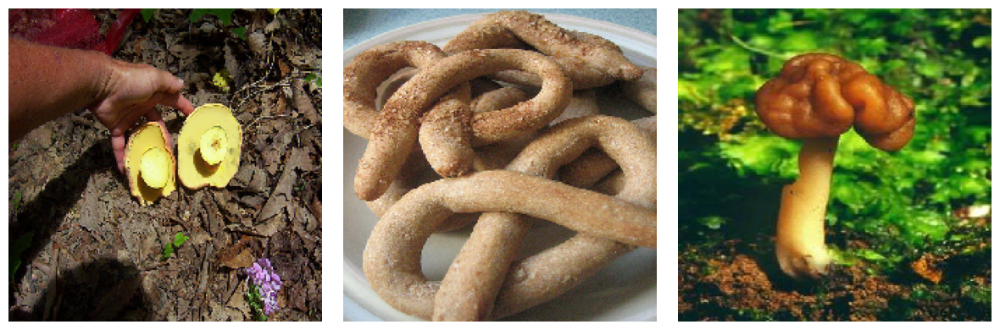

In [ ]:
img1 = images[0]
img2 = images[1]
img3 = images[2]
imgs = np.asarray([np.array(img1), np.array(img2), np.array(img3)])
import matplotlib.pyplot as plt

x = preprocess_input(imgs)
f, ax = plt.subplots(nrows=1, ncols=3, figsize=(12, 4))
for i in range(3):
    #ax[i].set_title(title, fontsize=16)
    ax[i].imshow(imgs[i])
    ax[i].axis('off')
plt.tight_layout()
plt.show()

Partition SHAP

In [ ]:
def f(X):
    tmp = X.copy()
    preprocess_input(tmp)
    return model(tmp)

In [ ]:
import cv2

In [ ]:
# define a masker that is used to mask out partitions of the input image, this one uses a blurred background
masker = shap.maskers.Image("inpaint_telea", images[0].shape)

In [ ]:
explainer = shap.Explainer(f, masker, output_names=class_names)

In [ ]:
shap_values = explainer(images[:100], max_evals=5000, batch_size=50, outputs=shap.Explanation.argsort.flip[:4])

2024-02-28 14:47:14.274144: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:442] Loaded cuDNN version 8905


  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:   1%|▍                                                | 1/100 [00:00<?, ?it/s]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:   3%|█▏                                     | 3/100 [01:57<1:01:39, 38.14s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:   4%|█▌                                     | 4/100 [02:57<1:15:30, 47.20s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:   5%|█▉                                     | 5/100 [04:17<1:33:55, 59.32s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:   6%|██▎                                    | 6/100 [05:26<1:38:26, 62.83s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:   7%|██▋                                    | 7/100 [06:45<1:45:28, 68.04s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:   8%|███                                    | 8/100 [07:51<1:43:21, 67.40s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:   9%|███▌                                   | 9/100 [08:28<1:27:33, 57.73s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  10%|███▊                                  | 10/100 [09:43<1:34:41, 63.13s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  11%|████▏                                 | 11/100 [10:40<1:30:56, 61.31s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  12%|████▌                                 | 12/100 [11:35<1:27:00, 59.33s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  13%|████▉                                 | 13/100 [12:05<1:13:25, 50.64s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  14%|█████▎                                | 14/100 [13:24<1:24:29, 58.94s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  15%|█████▋                                | 15/100 [14:29<1:26:05, 60.77s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  16%|██████                                | 16/100 [15:19<1:20:40, 57.62s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  17%|██████▍                               | 17/100 [16:09<1:16:34, 55.36s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  18%|██████▊                               | 18/100 [17:44<1:32:06, 67.40s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  19%|███████▏                              | 19/100 [18:39<1:25:38, 63.44s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  20%|███████▌                              | 20/100 [19:33<1:20:51, 60.65s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  21%|███████▉                              | 21/100 [20:31<1:18:51, 59.90s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  22%|████████▎                             | 22/100 [21:48<1:24:32, 65.03s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  23%|████████▋                             | 23/100 [23:05<1:28:02, 68.61s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  24%|█████████                             | 24/100 [24:18<1:28:33, 69.91s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  25%|█████████▌                            | 25/100 [25:05<1:18:52, 63.10s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  26%|█████████▉                            | 26/100 [25:55<1:13:08, 59.30s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  27%|██████████▎                           | 27/100 [26:51<1:10:50, 58.23s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  28%|██████████▋                           | 28/100 [27:50<1:09:58, 58.32s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  29%|███████████                           | 29/100 [28:49<1:09:26, 58.69s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  30%|███████████▍                          | 30/100 [30:03<1:13:47, 63.25s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  31%|███████████▊                          | 31/100 [31:15<1:15:45, 65.88s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  32%|████████████▏                         | 32/100 [33:00<1:27:52, 77.53s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  33%|████████████▌                         | 33/100 [34:19<1:27:16, 78.15s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  34%|████████████▉                         | 34/100 [35:07<1:15:59, 69.08s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  35%|█████████████▎                        | 35/100 [36:19<1:15:37, 69.81s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  36%|█████████████▋                        | 36/100 [37:02<1:05:50, 61.73s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  37%|██████████████                        | 37/100 [38:06<1:05:29, 62.37s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  38%|██████████████▍                       | 38/100 [39:21<1:08:26, 66.24s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  39%|███████████████▌                        | 39/100 [39:54<57:15, 56.32s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  40%|████████████████                        | 40/100 [40:32<50:45, 50.76s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  41%|████████████████▍                       | 41/100 [41:52<58:40, 59.66s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  42%|████████████████▊                       | 42/100 [42:57<59:13, 61.26s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  43%|█████████████████▏                      | 43/100 [43:50<55:54, 58.85s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  44%|█████████████████▌                      | 44/100 [44:54<56:12, 60.22s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  45%|██████████████████                      | 45/100 [45:48<53:37, 58.50s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  46%|██████████████████▍                     | 46/100 [46:38<50:18, 55.90s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  47%|██████████████████▊                     | 47/100 [48:04<57:19, 64.90s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  48%|██████████████████▏                   | 48/100 [50:01<1:09:39, 80.37s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  49%|██████████████████▌                   | 49/100 [50:55<1:01:47, 72.70s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  50%|████████████████████                    | 50/100 [51:43<54:15, 65.11s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  51%|████████████████████▍                   | 51/100 [52:34<49:40, 60.83s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  52%|████████████████████▊                   | 52/100 [53:43<50:47, 63.48s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  53%|█████████████████████▏                  | 53/100 [54:23<44:04, 56.27s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  54%|█████████████████████▌                  | 54/100 [55:34<46:37, 60.81s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  55%|██████████████████████                  | 55/100 [56:46<48:02, 64.05s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  56%|██████████████████████▍                 | 56/100 [57:58<48:43, 66.44s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  57%|██████████████████████▊                 | 57/100 [58:49<44:16, 61.79s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  58%|██████████████████████                | 58/100 [1:00:24<50:12, 71.74s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  59%|██████████████████████▍               | 59/100 [1:01:07<43:17, 63.35s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  60%|██████████████████████▊               | 60/100 [1:02:10<42:01, 63.05s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  61%|███████████████████████▏              | 61/100 [1:04:06<51:24, 79.10s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  62%|███████████████████████▌              | 62/100 [1:04:56<44:27, 70.20s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  63%|███████████████████████▉              | 63/100 [1:05:40<38:25, 62.31s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  64%|████████████████████████▎             | 64/100 [1:06:18<33:04, 55.13s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  65%|████████████████████████▋             | 65/100 [1:07:30<35:06, 60.18s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  66%|█████████████████████████             | 66/100 [1:08:07<30:12, 53.30s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  67%|█████████████████████████▍            | 67/100 [1:08:53<28:05, 51.08s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  68%|█████████████████████████▊            | 68/100 [1:09:39<26:26, 49.59s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  69%|██████████████████████████▏           | 69/100 [1:10:34<26:29, 51.26s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  70%|██████████████████████████▌           | 70/100 [1:11:22<25:00, 50.02s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  71%|██████████████████████████▉           | 71/100 [1:12:32<27:04, 56.00s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  72%|███████████████████████████▎          | 72/100 [1:13:47<28:49, 61.75s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  73%|███████████████████████████▋          | 73/100 [1:14:46<27:31, 61.15s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  74%|████████████████████████████          | 74/100 [1:15:35<24:51, 57.38s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  75%|████████████████████████████▌         | 75/100 [1:16:52<26:21, 63.24s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  76%|████████████████████████████▉         | 76/100 [1:18:10<27:04, 67.67s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  77%|█████████████████████████████▎        | 77/100 [1:19:34<27:50, 72.64s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  78%|█████████████████████████████▋        | 78/100 [1:20:40<25:54, 70.65s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  79%|██████████████████████████████        | 79/100 [1:21:28<22:20, 63.83s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  80%|██████████████████████████████▍       | 80/100 [1:22:33<21:24, 64.21s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  81%|██████████████████████████████▊       | 81/100 [1:23:23<18:55, 59.75s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  82%|███████████████████████████████▏      | 82/100 [1:24:17<17:24, 58.03s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  83%|███████████████████████████████▌      | 83/100 [1:24:56<14:52, 52.50s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  84%|███████████████████████████████▉      | 84/100 [1:25:45<13:44, 51.51s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  85%|████████████████████████████████▎     | 85/100 [1:27:09<15:17, 61.19s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  86%|████████████████████████████████▋     | 86/100 [1:28:12<14:22, 61.63s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  87%|█████████████████████████████████     | 87/100 [1:28:53<12:00, 55.44s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  88%|█████████████████████████████████▍    | 88/100 [1:29:44<10:49, 54.13s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  89%|█████████████████████████████████▊    | 89/100 [1:30:38<09:54, 54.07s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  90%|██████████████████████████████████▏   | 90/100 [1:31:29<08:51, 53.15s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  91%|██████████████████████████████████▌   | 91/100 [1:32:29<08:16, 55.12s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  92%|██████████████████████████████████▉   | 92/100 [1:33:23<07:19, 54.90s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  93%|███████████████████████████████████▎  | 93/100 [1:34:10<06:08, 52.66s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  94%|███████████████████████████████████▋  | 94/100 [1:35:14<05:34, 55.82s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  95%|████████████████████████████████████  | 95/100 [1:36:14<04:46, 57.21s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  96%|████████████████████████████████████▍ | 96/100 [1:37:20<03:59, 59.81s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  97%|████████████████████████████████████▊ | 97/100 [1:38:32<03:10, 63.47s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  98%|█████████████████████████████████████▏| 98/100 [1:39:22<01:58, 59.50s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer:  99%|█████████████████████████████████████▌| 99/100 [1:40:44<01:06, 66.29s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer: 100%|█████████████████████████████████████| 100/100 [1:41:40<00:00, 63.26s/it]

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer: 101it [1:42:29, 61.50s/it]                                                    


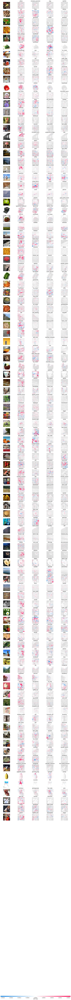

In [ ]:
shap.image_plot(shap_values)

In [ ]:
partvec=[]
for k in range(100):
  rw=[]
  r1=[]
  for i in range(224):
    r1=shap_values[k][i]
    for j in range(224):
        rw.append(r1.values[j][0][0])
  partvec.append(rw)

In [ ]:
partvec[49] #vector containing partition

[2.4163537038056454e-06,
 2.4163537038056454e-06,
 2.4163537038056454e-06,
 2.4163537038056454e-06,
 2.4163537038056445e-06,
 2.4163537038056445e-06,
 2.4163537038056445e-06,
 2.4163537038056454e-06,
 2.4163537038056454e-06,
 2.4163537038056454e-06,
 2.4163537038056454e-06,
 2.4163537038056445e-06,
 2.4163537038056445e-06,
 2.4163537038056445e-06,
 2.8764790453526236e-06,
 2.8764790453526236e-06,
 2.8764790453526236e-06,
 2.8764790453526236e-06,
 2.8764790453526236e-06,
 2.8764790453526236e-06,
 2.8764790453526236e-06,
 2.8764790453526236e-06,
 2.8764790453526236e-06,
 2.8764790453526236e-06,
 2.8764790453526236e-06,
 2.8764790453526236e-06,
 2.8764790453526236e-06,
 2.8764790453526236e-06,
 2.3770146550826333e-06,
 2.3770146550826333e-06,
 2.3770146550826333e-06,
 2.3770146550826333e-06,
 2.377014655082633e-06,
 2.377014655082633e-06,
 2.377014655082633e-06,
 2.3770146550826333e-06,
 2.3770146550826333e-06,
 2.3770146550826333e-06,
 2.3770146550826333e-06,
 2.377014655082633e-06,
 2.3

In [ ]:
#making negative values 0 in partition and deepshap
partvec_pos=[] #only positive scores
#deepvec_pos=[] #only positive scores
for k in range(100):
  partition_score_zero=[0 if i<0 else i for i in partvec[k]]
  partvec_pos.append(partition_score_zero)
  #deepshap_score_zero= [0 if i<0 else i for i in deepvec[k]]
  #deepvec_pos.append(deepshap_score_zero)

In [ ]:
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
replace2linear = ReplaceToLinear()
def model_modifier_function(cloned_model):
    cloned_model.layers[-1].activation = tf.keras.activations.linear

In [ ]:
#from tf_keras_vis.utils.scores import CategoricalScore
#score = CategoricalScore(rsult)

In [ ]:
from tf_keras_vis.utils.scores import CategoricalScore

#score = CategoricalScore([0,1,2,3,4,5,6,7,8,9])

# Instead of using CategoricalScore object,
# you can also define the function from scratch as follows:
def score_function(output):
    # The output variable refers to the output of the model,
    # so, in this case, output shape is (3, 1000) i.e., (samples, classes).
    return(output[:,])

In [ ]:
X=np.array(images,dtype="float32")

In [ ]:
X[0].shape

(224, 224, 3)

GradCAM

In [ ]:
from matplotlib import cm
from tf_keras_vis.gradcam import Gradcam

# Create Gradcam object
gradcam = Gradcam(model,
                  model_modifier=replace2linear,
                  clone=True)

# Generate heatmap with GradCAM
cam = gradcam(score_function,
              X[0:10],
              penultimate_layer=-1)

2024-02-28 16:34:23.729108: W tensorflow/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 4.58GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2024-02-28 16:34:23.824817: W tensorflow/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 4.36GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.


In [ ]:
import matplotlib.pyplot as plt

In [ ]:
cam20 = gradcam(score_function,
              X[10:20],
              penultimate_layer=-1)

In [ ]:
cam30 = gradcam(score_function,
              X[20:30],
              penultimate_layer=-1)

In [ ]:
cam40 = gradcam(score_function,
              X[30:40],
              penultimate_layer=-1)

In [ ]:
cam50 = gradcam(score_function,
              X[40:50],
              penultimate_layer=-1)

In [ ]:
cam60 = gradcam(score_function,
              X[50:60],
              penultimate_layer=-1)

In [ ]:
cam70 = gradcam(score_function,
              X[60:70],
              penultimate_layer=-1)

In [ ]:
cam80 = gradcam(score_function,
              X[70:80],
              penultimate_layer=-1)

In [ ]:
cam90 = gradcam(score_function,
              X[80:90],
              penultimate_layer=-1)

In [ ]:
cam100 = gradcam(score_function,
              X[90:100],
              penultimate_layer=-1)

In [ ]:
gradvec=[]
for k in range(10):
  rw=[]
  r1=[]
  for i in range(224):
    r1=cam[k][i]
    for j in range(224):
      rw.append(r1[j])
  gradvec.append(rw)
#print(rw)

In [ ]:
for k in range(10):
  rw=[]
  r1=[]
  for i in range(224):
    r1=cam20[k][i]
    for j in range(224):
      rw.append(r1[j])
  gradvec.append(rw)
#print(rw)

In [ ]:
for k in range(10):
  rw=[]
  r1=[]
  for i in range(224):
    r1=cam30[k][i]
    for j in range(224):
      rw.append(r1[j])
  gradvec.append(rw)
#print(rw)

In [ ]:
for k in range(10):
  rw=[]
  r1=[]
  for i in range(224):
    r1=cam40[k][i]
    for j in range(224):
      rw.append(r1[j])
  gradvec.append(rw)
#print(rw)

In [ ]:
for k in range(10):
  rw=[]
  r1=[]
  for i in range(224):
    r1=cam50[k][i]
    for j in range(224):
      rw.append(r1[j])
  gradvec.append(rw)
#print(rw)

In [ ]:
for k in range(10):
  rw=[]
  r1=[]
  for i in range(224):
    r1=cam60[k][i]
    for j in range(224):
      rw.append(r1[j])
  gradvec.append(rw)
#print(rw)

In [ ]:
for k in range(10):
  rw=[]
  r1=[]
  for i in range(224):
    r1=cam70[k][i]
    for j in range(224):
      rw.append(r1[j])
  gradvec.append(rw)
#print(rw)

In [ ]:
for k in range(10):
  rw=[]
  r1=[]
  for i in range(224):
    r1=cam80[k][i]
    for j in range(224):
      rw.append(r1[j])
  gradvec.append(rw)
#print(rw)

In [ ]:
for k in range(10):
  rw=[]
  r1=[]
  for i in range(224):
    r1=cam90[k][i]
    for j in range(224):
      rw.append(r1[j])
  gradvec.append(rw)
#print(rw)

In [ ]:
for k in range(10):
  rw=[]
  r1=[]
  for i in range(224):
    r1=cam100[k][i]
    for j in range(224):
      rw.append(r1[j])
  gradvec.append(rw)
#print(rw)

In [ ]:
len(gradvec)

100

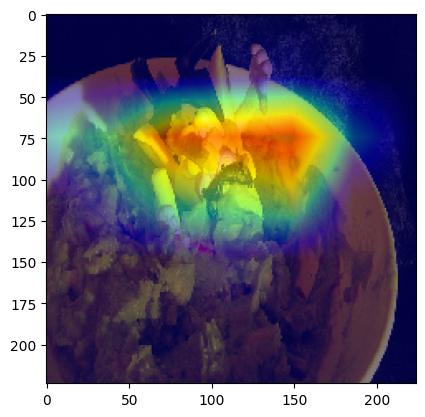

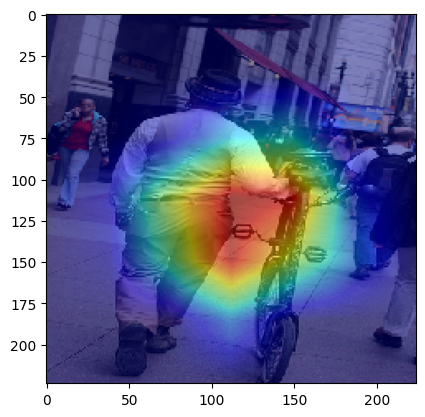

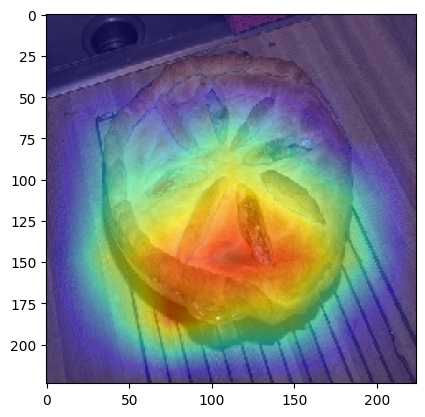

In [ ]:
for i in range(3):
    #ax[i].set_title(title, fontsize=16)
    heatmap = np.uint8(cm.jet(cam70[i])[..., :3] *255)
    plt.imshow(images[i+60])
    plt.imshow(heatmap, cmap='jet', alpha = 0.5)
    ax[i].axis('off')
    plt.show()

GradCAM++

In [ ]:
from tf_keras_vis.gradcam_plus_plus import GradcamPlusPlus

# Create GradCAM++ object
gradcampp = GradcamPlusPlus(model,
                          model_modifier=replace2linear,
                          clone=True)

# Generate heatmap with GradCAM++
campp = gradcampp(score_function,
              X[0:10],
              penultimate_layer=-1)

## Since v0.6.0, calling normalize() is NOT necessary.
# cam = normalize(cam)

In [ ]:
campp20 = gradcampp(score_function,
              X[10:20],
              penultimate_layer=-1)

In [ ]:
campp30 = gradcampp(score_function,
              X[20:30],
              penultimate_layer=-1)

In [ ]:
campp40 = gradcampp(score_function,
              X[30:40],
              penultimate_layer=-1)

In [ ]:
campp50 = gradcampp(score_function,
              X[40:50],
              penultimate_layer=-1)

In [ ]:
campp60 = gradcampp(score_function,
              X[50:60],
              penultimate_layer=-1)

In [ ]:
campp70 = gradcampp(score_function,
              X[60:70],
              penultimate_layer=-1)

In [ ]:
campp80 = gradcampp(score_function,
              X[70:80],
              penultimate_layer=-1)

In [ ]:
campp90 = gradcampp(score_function,
              X[80:90],
              penultimate_layer=-1)

In [ ]:
campp100 = gradcampp(score_function,
              X[90:100],
              penultimate_layer=-1)

In [ ]:
gradppvec=[]
for k in range(10):
  rw=[]
  r1=[]
  for i in range(224):
    r1=campp[k][i]
    for j in range(224):
      rw.append(r1[j])
  gradppvec.append(rw)

In [ ]:

for k in range(10):
  rw=[]
  r1=[]
  for i in range(224):
    r1=campp20[k][i]
    for j in range(224):
      rw.append(r1[j])
  gradppvec.append(rw)

In [ ]:

for k in range(10):
  rw=[]
  r1=[]
  for i in range(224):
    r1=campp30[k][i]
    for j in range(224):
      rw.append(r1[j])
  gradppvec.append(rw)

In [ ]:

for k in range(10):
  rw=[]
  r1=[]
  for i in range(224):
    r1=campp40[k][i]
    for j in range(224):
      rw.append(r1[j])
  gradppvec.append(rw)

In [ ]:

for k in range(10):
  rw=[]
  r1=[]
  for i in range(224):
    r1=campp50[k][i]
    for j in range(224):
      rw.append(r1[j])
  gradppvec.append(rw)

In [ ]:

for k in range(10):
  rw=[]
  r1=[]
  for i in range(224):
    r1=campp60[k][i]
    for j in range(224):
      rw.append(r1[j])
  gradppvec.append(rw)

In [ ]:

for k in range(10):
  rw=[]
  r1=[]
  for i in range(224):
    r1=campp70[k][i]
    for j in range(224):
      rw.append(r1[j])
  gradppvec.append(rw)

In [ ]:

for k in range(10):
  rw=[]
  r1=[]
  for i in range(224):
    r1=campp80[k][i]
    for j in range(224):
      rw.append(r1[j])
  gradppvec.append(rw)

In [ ]:

for k in range(10):
  rw=[]
  r1=[]
  for i in range(224):
    r1=campp90[k][i]
    for j in range(224):
      rw.append(r1[j])
  gradppvec.append(rw)

In [ ]:

for k in range(10):
  rw=[]
  r1=[]
  for i in range(224):
    r1=campp100[k][i]
    for j in range(224):
      rw.append(r1[j])
  gradppvec.append(rw)

In [ ]:
len(gradppvec)

100

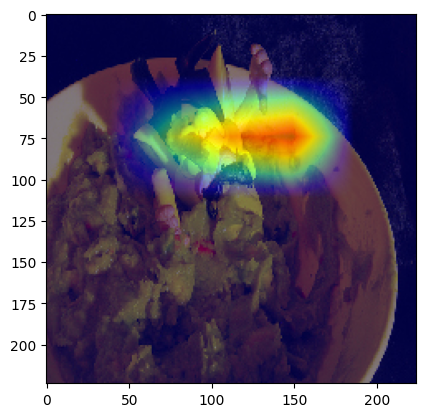

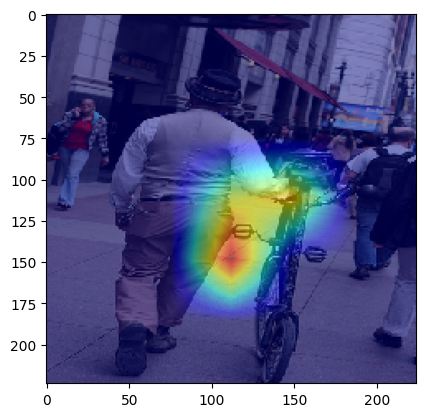

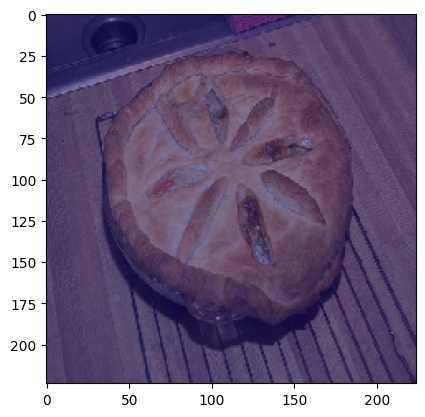

In [ ]:
for i in range(3):
    #ax[i].set_title(title, fontsize=16)
    heatmap = np.uint8(cm.jet(campp70[i])[..., :3] *255)
    plt.imshow(images[i+60])
    plt.imshow(heatmap, cmap='jet', alpha = 0.5)
    ax[i].axis('off')
    plt.show()

In [ ]:
#argsort descending order - pixel position
partvec_pixel=[]
gradvec_pixel=[]
for k in range(100): #partition
  rw_temp=partvec_pos[k]
  revid=np.argsort(rw_temp)[::-1][:51076]
  partvec_pixel.append(revid)

In [ ]:
for k in range(100): #gradcam
  rw_temp=gradvec[k]
  revid=np.argsort(rw_temp)[::-1][:51076]
  gradvec_pixel.append(revid)

In [ ]:
gradppvec_pixel=[]
for k in range(100): #gradcam++
  rw_temp=gradppvec[k]
  revid=np.argsort(rw_temp)[::-1][:51076]
  gradppvec_pixel.append(revid)

Multiple correlation

In [ ]:
import math
def multcorr(a,b,c): #a-partition, b-gradcam, c-gradcam++ (3 variables)
  ans=[]
  for k in range(100):
    partvec1000 = a[k][0:1000]
    gradvec1000 = b[k][0:1000]
    gradppvec1000 = c[k][0:1000]
    temp=[]
    r12=np.corrcoef(partvec1000,gradvec1000)
    r13=np.corrcoef(partvec1000, gradppvec1000)
    r23=np.corrcoef(gradvec1000, gradppvec1000)
    R1_23=math.sqrt((r12[0][1]*r12[0][1]+r13[0][1]*r13[0][1]-2*(r12[0][1]*r13[0][1]*r23[0][1]))/(1-r23[0][1]*r23[0][1]))
    R2_13=math.sqrt((r12[0][1]*r12[0][1]+r23[0][1]*r23[0][1]-2*(r12[0][1]*r23[0][1]*r13[0][1]))/(1-r13[0][1]*r13[0][1]))
    R3_12=math.sqrt((r13[0][1]*r13[0][1]+r23[0][1]*r23[0][1]-2*(r13[0][1]*r23[0][1]*r12[0][1]))/(1-r12[0][1]*r12[0][1]))
    temp.append(R1_23)
    temp.append(R2_13)
    temp.append(R3_12)
    ans.append(temp)
  return ans

In [ ]:
out=multcorr(partvec_pixel,gradvec_pixel,gradppvec_pixel)
out

[[0.10215195430694031, 0.04978569785975447, 0.1000451651298729],
 [0.20742547606390577, 0.2076169697318626, 0.06871120883255004],
 [0.17819207790751018, 0.14100985679579098, 0.1566288700903418],
 [0.25193024745493836, 0.06873118645203029, 0.25636871487690605],
 [0.030551328063087593, 0.12363546420849751, 0.12132100803078752],
 [0.06227653816078115, 0.07328125699005977, 0.04563436204643935],
 [0.15297251119703642, 0.15529648305540852, 0.03376731377617246],
 [0.11442477701074547, 0.07448210104856635, 0.1356874926354868],
 [0.11639808638131315, 0.05309700013662751, 0.11359276094961589],
 [0.10310716391549248, 0.09105981294238756, 0.11271231444214998],
 [0.022723517104755647, 0.022693706814501443, 0.013239602426308767],
 [0.1428161031655694, 0.07754252956966515, 0.16085426495542463],
 [0.04864046096273187, 0.013587026404826492, 0.0498738917179702],
 [0.0549348385877378, 0.061419077324570005, 0.03568229931943956],
 [0.15889878715027775, 0.14291408804647818, 0.13777116983510204],
 [0.0327243

In [ ]:
iout=[]
for i in range(100):
  x=np.argsort(out[i])[::-1][:51076]
  iout.append(x)
iout

[array([0, 2, 1]),
 array([1, 0, 2]),
 array([0, 2, 1]),
 array([2, 0, 1]),
 array([1, 2, 0]),
 array([1, 0, 2]),
 array([1, 0, 2]),
 array([2, 0, 1]),
 array([0, 2, 1]),
 array([2, 0, 1]),
 array([0, 1, 2]),
 array([2, 0, 1]),
 array([2, 0, 1]),
 array([1, 0, 2]),
 array([0, 1, 2]),
 array([2, 1, 0]),
 array([1, 0, 2]),
 array([1, 2, 0]),
 array([0, 2, 1]),
 array([0, 1, 2]),
 array([2, 0, 1]),
 array([1, 0, 2]),
 array([1, 0, 2]),
 array([2, 1, 0]),
 array([0, 1, 2]),
 array([0, 1, 2]),
 array([2, 1, 0]),
 array([1, 0, 2]),
 array([2, 1, 0]),
 array([1, 0, 2]),
 array([2, 1, 0]),
 array([0, 1, 2]),
 array([0, 1, 2]),
 array([0, 2, 1]),
 array([0, 2, 1]),
 array([0, 2, 1]),
 array([2, 0, 1]),
 array([0, 1, 2]),
 array([0, 2, 1]),
 array([0, 2, 1]),
 array([1, 0, 2]),
 array([1, 2, 0]),
 array([1, 2, 0]),
 array([0, 2, 1]),
 array([0, 2, 1]),
 array([2, 0, 1]),
 array([0, 2, 1]),
 array([1, 0, 2]),
 array([0, 2, 1]),
 array([0, 2, 1]),
 array([0, 1, 2]),
 array([2, 1, 0]),
 array([0, 2

In [ ]:
#making 0as 1, 1as 2 ...
iout1=[]
for i in range(100):
  temp=iout[i]
  t=[x+1 for x in temp]
  iout1.append(t)
iout1

[[1, 3, 2],
 [2, 1, 3],
 [1, 3, 2],
 [3, 1, 2],
 [2, 3, 1],
 [2, 1, 3],
 [2, 1, 3],
 [3, 1, 2],
 [1, 3, 2],
 [3, 1, 2],
 [1, 2, 3],
 [3, 1, 2],
 [3, 1, 2],
 [2, 1, 3],
 [1, 2, 3],
 [3, 2, 1],
 [2, 1, 3],
 [2, 3, 1],
 [1, 3, 2],
 [1, 2, 3],
 [3, 1, 2],
 [2, 1, 3],
 [2, 1, 3],
 [3, 2, 1],
 [1, 2, 3],
 [1, 2, 3],
 [3, 2, 1],
 [2, 1, 3],
 [3, 2, 1],
 [2, 1, 3],
 [3, 2, 1],
 [1, 2, 3],
 [1, 2, 3],
 [1, 3, 2],
 [1, 3, 2],
 [1, 3, 2],
 [3, 1, 2],
 [1, 2, 3],
 [1, 3, 2],
 [1, 3, 2],
 [2, 1, 3],
 [2, 3, 1],
 [2, 3, 1],
 [1, 3, 2],
 [1, 3, 2],
 [3, 1, 2],
 [1, 3, 2],
 [2, 1, 3],
 [1, 3, 2],
 [1, 3, 2],
 [1, 2, 3],
 [3, 2, 1],
 [1, 3, 2],
 [1, 2, 3],
 [3, 1, 2],
 [2, 1, 3],
 [2, 1, 3],
 [2, 3, 1],
 [1, 2, 3],
 [1, 2, 3],
 [2, 1, 3],
 [3, 1, 2],
 [1, 3, 2],
 [1, 2, 3],
 [3, 1, 2],
 [2, 1, 3],
 [2, 3, 1],
 [2, 1, 3],
 [1, 3, 2],
 [3, 1, 2],
 [1, 3, 2],
 [2, 3, 1],
 [2, 1, 3],
 [1, 3, 2],
 [3, 2, 1],
 [2, 3, 1],
 [1, 3, 2],
 [3, 1, 2],
 [3, 1, 2],
 [2, 1, 3],
 [2, 3, 1],
 [1, 3, 2],
 [2, 3, 1],
 [3,

In [ ]:
def borda_count(votes):
    num_candidates = len(votes[0])
    scores = {candidate: 0 for candidate in range(1, num_candidates + 1)}

    for ballot in votes:
        for index, candidate in enumerate(ballot):
            scores[candidate] += num_candidates - index - 1

    sorted_scores = sorted(scores.items(), key=lambda x: x[1], reverse=True)
    return sorted_scores

Rank

In [ ]:
ballots=iout1
result = borda_count(ballots)
print("Borda Count Result:")
for candidate, score in result:
    print(f"Candidate {candidate}: {score} points")

Borda Count Result:
Candidate 1: 122 points
Candidate 3: 92 points
Candidate 2: 86 points


In [ ]:
#final ranking - Multiple correlation
#based borda count ranking
borda_rank=[]
for candidate, score in result:
    borda_rank.append(candidate)
borda_rank

[1, 3, 2]

In [ ]:
#borda count preprocessing - making 0 as 1, 1 as 2,...
partpixel1=[x+1 for x in partvec_pixel]
gradpixel1=[x+1 for x in gradvec_pixel]
gradpppixel1=[x+1 for x in gradppvec_pixel]

Borda count method

In [ ]:
def calculateborda(a,b,c):
  bordarank=[]
  for k in range(100):
    ballot=[]
    ballot.append(a[k])
    ballot.append(b[k])
    ballot.append(c[k])
    print(ballot)
    res=borda_count(ballot)
    borda_rank=[]
    for candidate, score in res:
      borda_rank.append(candidate) #single instance
    bordarank.append(borda_rank)
  return bordarank #for 50 samples

In [ ]:
bordarank=calculateborda(partpixel1,gradpixel1,gradpppixel1)
bordarank

[array([15382, 15151, 15373, ..., 25370, 25371,     1]), array([16688, 16689, 16912, ..., 42541, 42542,     1]), array([16689, 16688, 16464, ..., 33447, 33446,     1])]
[array([12900, 13575, 14690, ..., 20172, 20173, 25088]), array([41740, 41741, 41742, ..., 20456, 20457,     1]), array([50176, 16733, 16731, ..., 33447, 33446,     1])]
[array([21374, 21152, 20929, ..., 37409, 37410, 40122]), array([24977, 24976, 25201, ..., 42501, 42502,     1]), array([24977, 24976, 25201, ..., 35459, 35458,     1])]
[array([20503, 21180, 20950, ..., 14815, 14816, 11906]), array([25014, 25013, 25012, ...,  4526,  4525,     1]), array([50176, 16733, 16731, ..., 33447, 33446,     1])]
[array([39476, 39473, 39916, ..., 44430, 44431,     1]), array([33227, 33451, 33228, ..., 11392, 11391,     1]), array([33526, 33302, 33525, ..., 32091, 32090,     1])]
[array([42223, 41987, 41771, ..., 38661, 38662, 18453]), array([33489, 33490, 33491, ..., 10519, 10518,     1]), array([33525, 33749, 33973, ..., 17275, 17

[[14000,
  13999,
  13776,
  15561,
  13998,
  13775,
  15337,
  13552,
  13328,
  15560,
  13551,
  13774,
  15113,
  13997,
  15336,
  13327,
  13104,
  13550,
  14889,
  13773,
  13996,
  15559,
  15112,
  13326,
  12880,
  13103,
  15335,
  14665,
  13549,
  13772,
  13995,
  14888,
  12879,
  13102,
  15558,
  15111,
  12656,
  14441,
  13325,
  13548,
  15334,
  14664,
  13771,
  13994,
  12878,
  14217,
  12655,
  14887,
  13324,
  14440,
  13101,
  15557,
  15110,
  13547,
  13770,
  12654,
  14663,
  12877,
  15333,
  14216,
  14886,
  13323,
  13100,
  14439,
  13546,
  14662,
  15109,
  15556,
  12653,
  12876,
  13322,
  13099,
  14215,
  15332,
  14438,
  14885,
  12875,
  12652,
  14661,
  15555,
  15108,
  13098,
  14214,
  15331,
  14437,
  12874,
  14884,
  12651,
  14660,
  15107,
  14213,
  12650,
  14436,
  14883,
  18929,
  14659,
  14212,
  14435,
  18930,
  19153,
  14211,
  18931,
  19154,
  19377,
  19155,
  18932,
  19378,
  19601,
  20497,
  19156,
  18933,
 

In [ ]:
def bordarankcorr(a,b,c,borda):
  bordarank_allimages=[]
  for k in range(100):
    temp=[]
    a_borda=np.corrcoef(a[k],borda[k])
    b_borda=np.corrcoef(b[k],borda[k])
    c_borda=np.corrcoef(c[k],borda[k])
    temp.append(a_borda[0][1])
    temp.append(b_borda[0][1])
    temp.append(c_borda[0][1])
    t=np.argsort(temp)[::-1][:3]
    bordarank_allimages.append(t)
  return bordarank_allimages

In [ ]:
borda_allimages=bordarankcorr(partpixel1,gradpixel1,gradpppixel1,bordarank)
borda_allimages

[array([2, 1, 0]),
 array([2, 0, 1]),
 array([1, 2, 0]),
 array([2, 1, 0]),
 array([0, 1, 2]),
 array([1, 2, 0]),
 array([2, 1, 0]),
 array([1, 0, 2]),
 array([1, 0, 2]),
 array([2, 1, 0]),
 array([2, 1, 0]),
 array([1, 2, 0]),
 array([2, 0, 1]),
 array([0, 1, 2]),
 array([2, 0, 1]),
 array([0, 2, 1]),
 array([2, 0, 1]),
 array([1, 0, 2]),
 array([1, 0, 2]),
 array([2, 1, 0]),
 array([2, 1, 0]),
 array([0, 2, 1]),
 array([1, 2, 0]),
 array([1, 2, 0]),
 array([1, 0, 2]),
 array([2, 1, 0]),
 array([2, 0, 1]),
 array([1, 0, 2]),
 array([0, 1, 2]),
 array([2, 1, 0]),
 array([1, 2, 0]),
 array([2, 0, 1]),
 array([2, 1, 0]),
 array([0, 1, 2]),
 array([2, 1, 0]),
 array([2, 1, 0]),
 array([2, 0, 1]),
 array([2, 1, 0]),
 array([2, 0, 1]),
 array([2, 1, 0]),
 array([2, 1, 0]),
 array([0, 2, 1]),
 array([1, 2, 0]),
 array([0, 2, 1]),
 array([1, 2, 0]),
 array([2, 0, 1]),
 array([2, 1, 0]),
 array([0, 1, 2]),
 array([2, 0, 1]),
 array([1, 0, 2]),
 array([2, 1, 0]),
 array([2, 0, 1]),
 array([1, 2

In [ ]:
n0=n1=n2=n3=0
for i in range(100):
  if borda_allimages[i][0]==0:
    n0+=1
  elif borda_allimages[i][0]==1:
    n1+=1
  elif borda_allimages[i][0]==2:
    n2+=1
  else:
    n3+=1
print(n0,n1,n2)

17 32 51


In [ ]:
#making 0as 1, 1as 2 ...
iout1=[]
for i in range(100):
  temp=borda_allimages[i]
  t=[x+1 for x in temp]
  iout1.append(t)
iout1

[[3, 2, 1],
 [3, 1, 2],
 [2, 3, 1],
 [3, 2, 1],
 [1, 2, 3],
 [2, 3, 1],
 [3, 2, 1],
 [2, 1, 3],
 [2, 1, 3],
 [3, 2, 1],
 [3, 2, 1],
 [2, 3, 1],
 [3, 1, 2],
 [1, 2, 3],
 [3, 1, 2],
 [1, 3, 2],
 [3, 1, 2],
 [2, 1, 3],
 [2, 1, 3],
 [3, 2, 1],
 [3, 2, 1],
 [1, 3, 2],
 [2, 3, 1],
 [2, 3, 1],
 [2, 1, 3],
 [3, 2, 1],
 [3, 1, 2],
 [2, 1, 3],
 [1, 2, 3],
 [3, 2, 1],
 [2, 3, 1],
 [3, 1, 2],
 [3, 2, 1],
 [1, 2, 3],
 [3, 2, 1],
 [3, 2, 1],
 [3, 1, 2],
 [3, 2, 1],
 [3, 1, 2],
 [3, 2, 1],
 [3, 2, 1],
 [1, 3, 2],
 [2, 3, 1],
 [1, 3, 2],
 [2, 3, 1],
 [3, 1, 2],
 [3, 2, 1],
 [1, 2, 3],
 [3, 1, 2],
 [2, 1, 3],
 [3, 2, 1],
 [3, 1, 2],
 [2, 3, 1],
 [2, 1, 3],
 [2, 3, 1],
 [2, 1, 3],
 [3, 1, 2],
 [3, 1, 2],
 [3, 1, 2],
 [3, 2, 1],
 [3, 2, 1],
 [1, 2, 3],
 [1, 3, 2],
 [3, 2, 1],
 [1, 2, 3],
 [1, 3, 2],
 [2, 3, 1],
 [3, 2, 1],
 [3, 2, 1],
 [2, 1, 3],
 [3, 1, 2],
 [2, 1, 3],
 [3, 2, 1],
 [2, 3, 1],
 [3, 2, 1],
 [3, 2, 1],
 [3, 1, 2],
 [3, 1, 2],
 [1, 3, 2],
 [2, 1, 3],
 [2, 1, 3],
 [2, 1, 3],
 [2, 3, 1],
 [1,

Rank

In [ ]:
ballots_final=iout1
result_final = borda_count(ballots_final)
print("Borda Count Result:")
for candidate, score in result_final:
    print(f"Candidate {candidate}: {score} points")

Borda Count Result:
Candidate 3: 125 points
Candidate 2: 102 points
Candidate 1: 73 points


In [ ]:
#final ranking - borda count ranking
borda_rank_final=[]
for candidate, score in result_final:
    borda_rank_final.append(candidate)
borda_rank_final

[3, 2, 1]